# Exploratory Data Analysis

This notebook performs exploratory analysis on the cleaned social-media posts and user datasets.

The workflow produces:
- presentation-quality Seaborn visualizations
- quantitative summary tables
- analytical findings derived from the actual dataset
- a formatted PDF EDA report containing the results and generated figures

The cleaned datasets are assumed to be available as `Social_Engine_Posts_Cleaned.csv` and `Social_Engine_Users.csv` in the notebook's working directory.

In [1]:
!pip install matplotlib
!pip install seaborn
!pip install pandas

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from pathlib import Path
from matplotlib.ticker import FuncFormatter
from matplotlib.backends.backend_pdf import PdfPages
from textwrap import wrap

sns.set_theme(
    style='whitegrid',
    context='notebook',
    font_scale=1.05
)

plt.rcParams.update({
    'figure.dpi': 120,
    'savefig.dpi': 180,
    'axes.titleweight': 'bold',
    'axes.titlepad': 14,
    'axes.labelpad': 8,
    'legend.frameon': False,
    'axes.spines.top': False,
    'axes.spines.right': False
})

POSTS_FILE = 'Social_Engine_Posts_Cleaned.csv'
USERS_FILE = 'Social_Engine_Users.csv'

df_posts = pd.read_csv(POSTS_FILE)
df_users = pd.read_csv(USERS_FILE)

df_posts['text_length'] = df_posts['text_content'].str.len()

print(f'Posts: {df_posts.shape[0]:,} rows × {df_posts.shape[1]} columns')
print(f'Users: {df_users.shape[0]:,} rows × {df_users.shape[1]} columns')

Posts: 12,000 rows × 10 columns
Users: 1,500 rows × 5 columns


## 1. Dataset Overview

In [3]:
print('Posts dataset:')
display(df_posts.head())

print('\nUsers dataset:')
display(df_users.head())

print('\nPost date range:')
print(df_posts['date'].min(), 'to', df_posts['date'].max())

print('\nUnique users with posts:')
print(f"{df_posts['user_id'].nunique():,}")

print('\nMissing values in posts:')
post_missing = df_posts.drop(columns=['time'], errors='ignore').isna().sum()
display(post_missing.sort_values(ascending=False).to_frame('missing_count'))

print('\nMissing values in users:')
display(df_users.isna().sum().sort_values(ascending=False).to_frame('missing_count'))

print('\nEngagement summary:')
display(
    df_posts[['likes', 'shares', 'comments']]
    .describe()
    .round(2)
)

Posts dataset:


,post_id,user_id,platform,text_content,likes,shares,comments,date,time,text_length
0,to64mgey2v3y,user_vfxs1pry,Reddit,Bummed out with my new Air Max from Nike! Abso...,4488.0,1456,673,2024-09-25,NaN,99.0
1,7f0wdauzbj89,user_8l7rv5oe,Reddit,My one month review of Pepsi Crystal Pepsi: Hi...,789.0,1484,39,2024-08-01,16:14:00,113.0
2,dvvhg8eel45x,user_nfo3ih5u,NaN,Just unboxed my new Highlander from Toyota. Ex...,NaN,1410,839,2025-04-13,20:12:18,136.0
3,hgb9cxke4t7b,user_27aje6ur,Facebook,Comparing Pepsi Crystal Pepsi to the competiti...,167.0,584,833,2024-09-10,NaN,124.0
4,zwerpw3wk320,user_9px5q0by,Reddit,My one week review of Coca-Cola Diet Coke: Bes...,4749.0,152,630,2024-05-31,NaN,116.0



Users dataset:


,user_id,location,language,account_created,follower_count
0,user_guglt5jp,"Berlin, Germany",ja,2023-10-23,38963
1,user_b1p3wz81,"Munich, Germany",zh,2023-05-06,24644
2,user_jm2grmis,"Dubai, UAE",en,2023-01-03,45842
3,user_ykoqww5l,"Paris, France",fr,2023-10-11,665
4,user_3zzvv8vp,"Los Angeles, USA",ru,2023-05-23,42908



Post date range:
2024-05-01 to 2025-04-30

Unique users with posts:
1,500

Missing values in posts:


,missing_count
likes,1814
platform,1784
text_content,1760
text_length,1760
post_id,0
user_id,0
shares,0
comments,0
date,0



Missing values in users:


,missing_count
user_id,0
location,0
language,0
account_created,0
follower_count,0



Engagement summary:


,likes,shares,comments
count,10186.00,12000.00,12000.00
mean,2491.86,1007.17,504.35
std,1437.83,575.07,288.68
min,0.00,0.00,0.00
25%,1236.00,510.00,253.00
50%,2498.00,1018.00,503.00
75%,3722.75,1501.00,755.00
max,5000.00,2000.00,1000.00


## 2. Plotting Helpers

The following helpers keep the visual style consistent across the analysis.

In [4]:
def add_value_labels(ax, fmt='{:.0f}', rotation=0):
    for container in ax.containers:
        labels = []
        for bar in container:
            value = bar.get_height()
            labels.append(fmt.format(value) if pd.notna(value) else '')
        ax.bar_label(container, labels=labels, padding=3, rotation=rotation)


def format_compact(value, _):
    if abs(value) >= 1_000_000:
        return f'{value / 1_000_000:.1f}M'
    if abs(value) >= 1_000:
        return f'{value / 1_000:.0f}K'
    return f'{value:.0f}'


def finish_ax(ax):
    ax.grid(axis='y', alpha=0.18)
    ax.tick_params(axis='both', length=0)
    sns.despine(ax=ax, left=False, bottom=False)


def style_figure(title, subtitle=None, figsize=(12, 6)):
    fig, ax = plt.subplots(figsize=figsize)
    fig.suptitle(title, x=0.06, y=0.98, ha='left', fontsize=17, fontweight='bold')
    if subtitle:
        fig.text(0.06, 0.925, subtitle, ha='left', fontsize=10.5, alpha=0.72)
    return fig, ax

## 3. Platform Distribution

**Question:** How are posts distributed across platforms?

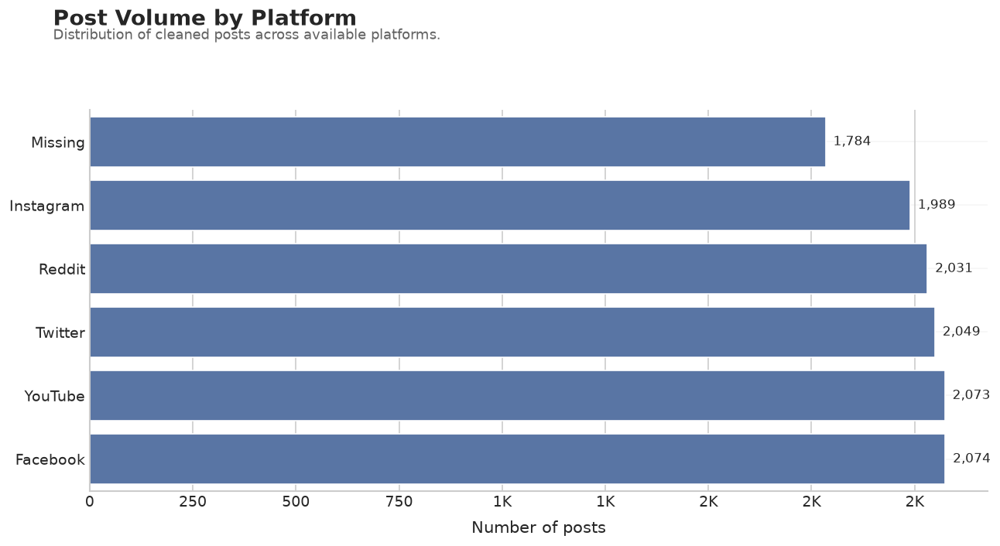

In [5]:
platform_counts = (
    df_posts['platform']
    .fillna('Missing')
    .value_counts()
    .sort_values(ascending=True)
)

fig, ax = style_figure(
    'Post Volume by Platform',
    'Distribution of cleaned posts across available platforms.',
    figsize=(11, 6)
)

sns.barplot(
    x=platform_counts.values,
    y=platform_counts.index,
    ax=ax
)

ax.set_xlabel('Number of posts')
ax.set_ylabel('')
ax.xaxis.set_major_formatter(FuncFormatter(format_compact))

for i, value in enumerate(platform_counts.values):
    ax.text(value, i, f'  {value:,}', va='center', fontsize=10)

finish_ax(ax)
plt.tight_layout(rect=[0, 0, 1, 0.90])
plt.show()

## 4. Daily Posting Activity

**Question:** How does posting activity change over time?

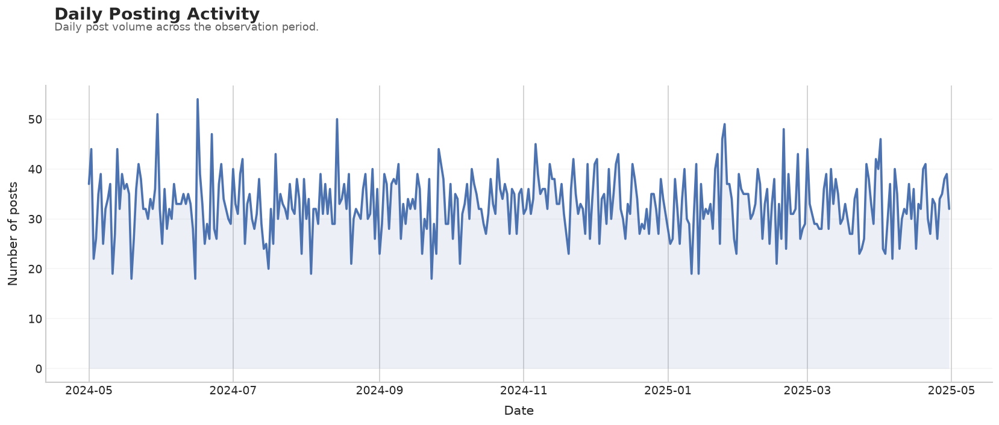

In [6]:
daily_posts = (
    df_posts.groupby('date')
    .size()
    .reset_index(name='post_count')
)

daily_posts['date'] = pd.to_datetime(daily_posts['date'])
daily_posts = daily_posts.sort_values('date')

fig, ax = style_figure(
    'Daily Posting Activity',
    'Daily post volume across the observation period.',
    figsize=(14, 6)
)

sns.lineplot(
    data=daily_posts,
    x='date',
    y='post_count',
    ax=ax,
    linewidth=2.2
)

ax.fill_between(
    daily_posts['date'],
    daily_posts['post_count'],
    alpha=0.10
)

ax.set_xlabel('Date')
ax.set_ylabel('Number of posts')
ax.yaxis.set_major_formatter(FuncFormatter(format_compact))
finish_ax(ax)
plt.tight_layout(rect=[0, 0, 1, 0.90])
plt.show()

## 5. Posting Activity by Day of Week

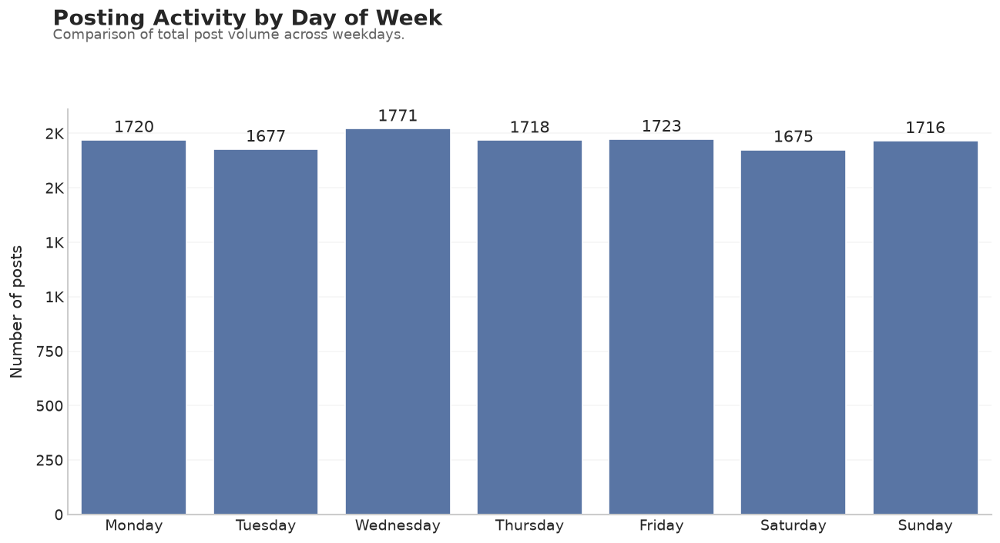

In [7]:
weekday_order = [
    'Monday', 'Tuesday', 'Wednesday',
    'Thursday', 'Friday', 'Saturday', 'Sunday'
]

weekday_counts = (
    pd.to_datetime(df_posts['date'], errors='coerce')
    .dt.day_name()
    .value_counts()
    .reindex(weekday_order)
)

fig, ax = style_figure(
    'Posting Activity by Day of Week',
    'Comparison of total post volume across weekdays.',
    figsize=(11, 6)
)

sns.barplot(
    x=weekday_counts.index,
    y=weekday_counts.values,
    ax=ax
)

ax.set_xlabel('')
ax.set_ylabel('Number of posts')
ax.yaxis.set_major_formatter(FuncFormatter(format_compact))

for container in ax.containers:
    ax.bar_label(container, fmt='%.0f', padding=3)

finish_ax(ax)
plt.xticks(rotation=0)
plt.tight_layout(rect=[0, 0, 1, 0.90])
plt.show()

## 6. Posting Activity by Hour

Date-only records are excluded because their original posting time is unknown.

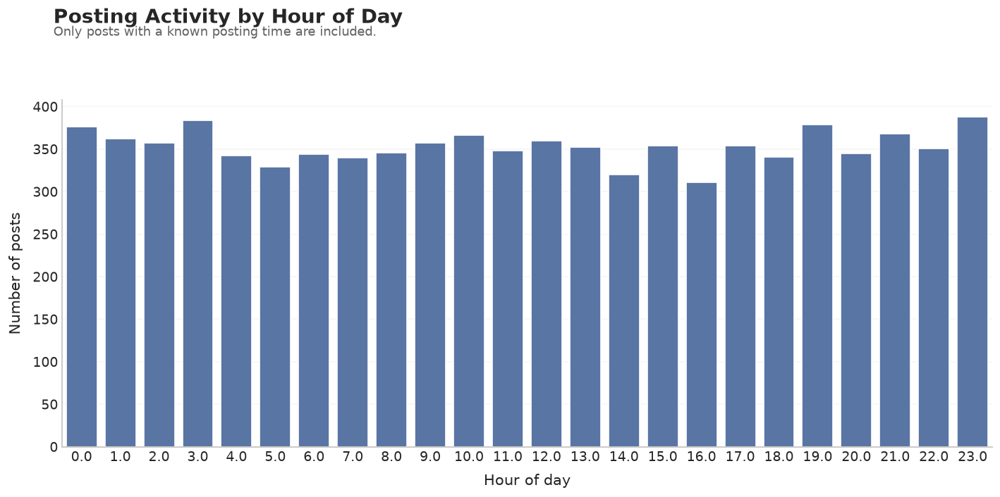

In [8]:
time_values = pd.to_datetime(
    df_posts['time'],
    format='%H:%M:%S',
    errors='coerce'
)

hour_counts = time_values.dt.hour.value_counts().sort_index()

fig, ax = style_figure(
    'Posting Activity by Hour of Day',
    'Only posts with a known posting time are included.',
    figsize=(12, 6)
)

sns.barplot(
    x=hour_counts.index,
    y=hour_counts.values,
    ax=ax
)

ax.set_xlabel('Hour of day')
ax.set_ylabel('Number of posts')
ax.set_xticks(range(24))
ax.yaxis.set_major_formatter(FuncFormatter(format_compact))

finish_ax(ax)
plt.tight_layout(rect=[0, 0, 1, 0.90])
plt.show()

## 7. Engagement Distributions

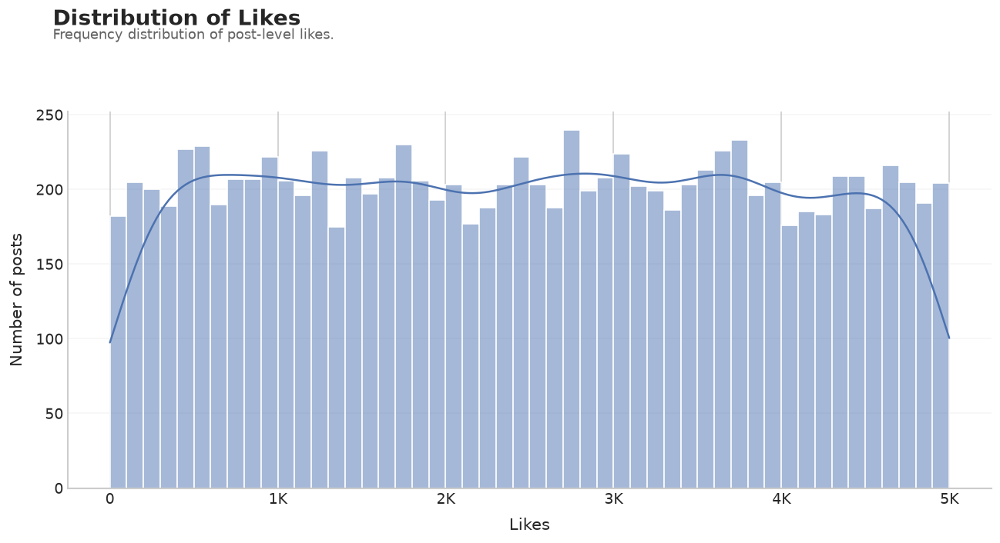

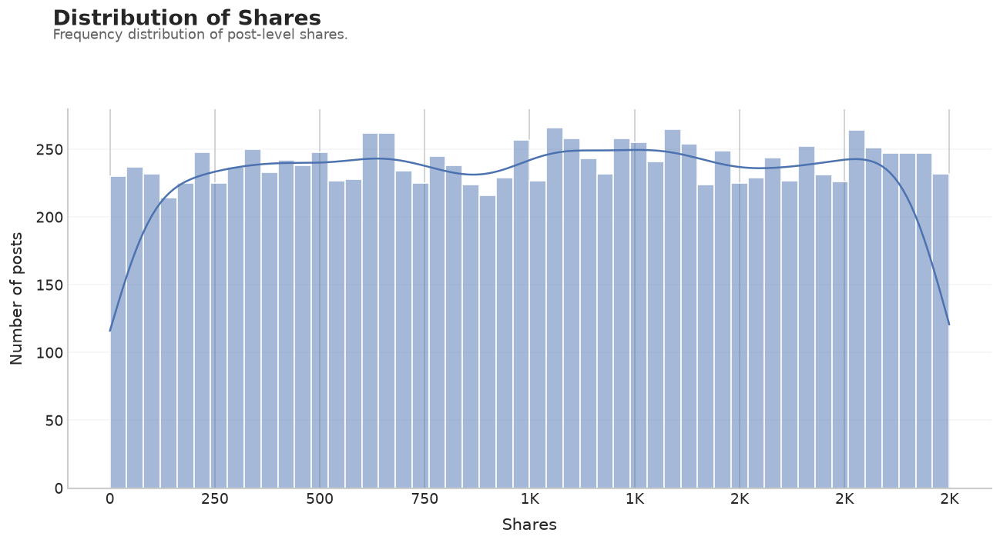

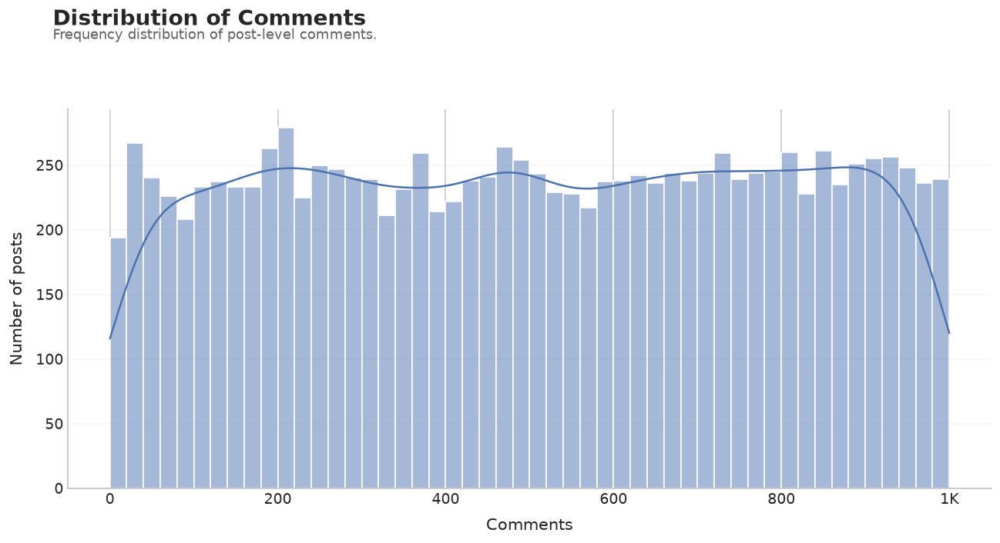

In [9]:
for column in ['likes', 'shares', 'comments']:
    fig, ax = style_figure(
        f'Distribution of {column.title()}',
        f'Frequency distribution of post-level {column}.',
        figsize=(11, 6)
    )

    sns.histplot(
        data=df_posts,
        x=column,
        bins=50,
        kde=True,
        ax=ax
    )

    ax.set_xlabel(column.title())
    ax.set_ylabel('Number of posts')
    ax.xaxis.set_major_formatter(FuncFormatter(format_compact))

    finish_ax(ax)
    plt.tight_layout(rect=[0, 0, 1, 0.90])
    plt.show()

## 8. Engagement by Platform

**Question:** Does engagement differ across platforms?

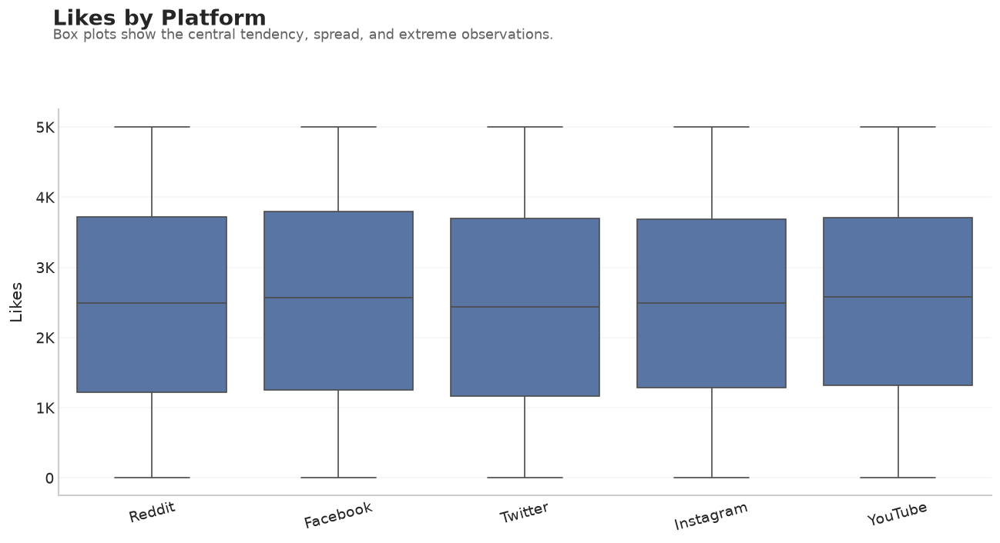

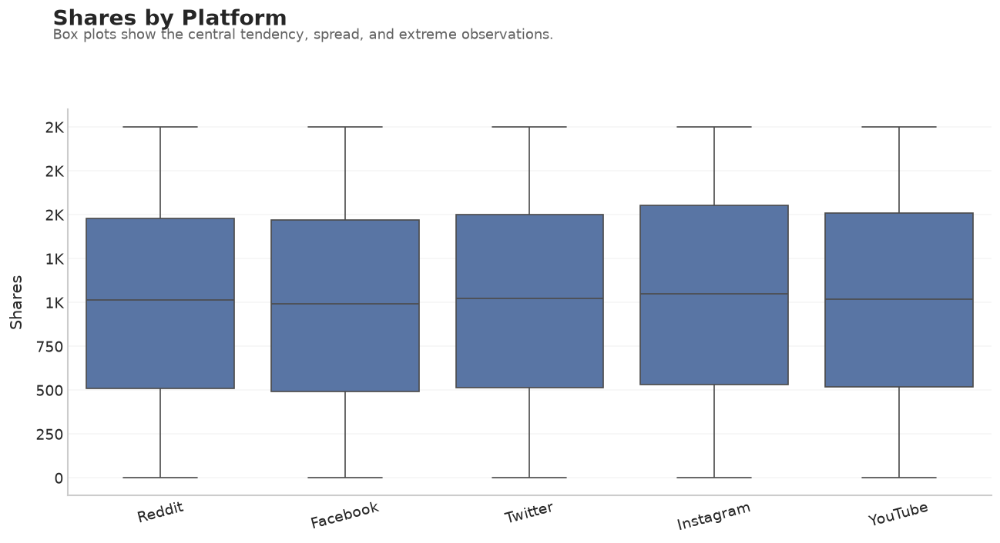

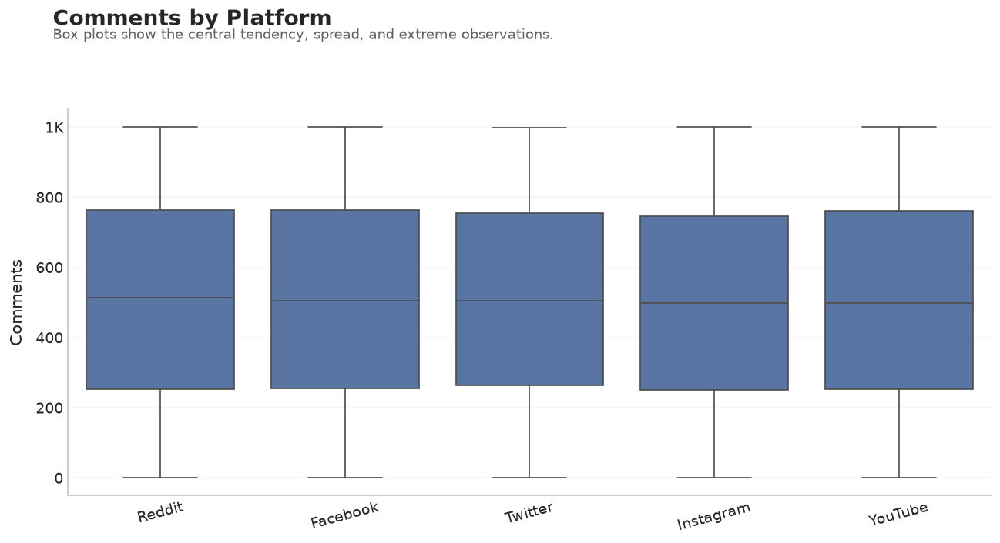

In [10]:
for column in ['likes', 'shares', 'comments']:
    fig, ax = style_figure(
        f'{column.title()} by Platform',
        'Box plots show the central tendency, spread, and extreme observations.',
        figsize=(11, 6)
    )

    sns.boxplot(
        data=df_posts,
        x='platform',
        y=column,
        ax=ax,
        showfliers=False
    )

    ax.set_xlabel('')
    ax.set_ylabel(column.title())
    ax.yaxis.set_major_formatter(FuncFormatter(format_compact))
    plt.xticks(rotation=15)

    finish_ax(ax)
    plt.tight_layout(rect=[0, 0, 1, 0.90])
    plt.show()

## 9. Engagement Relationships

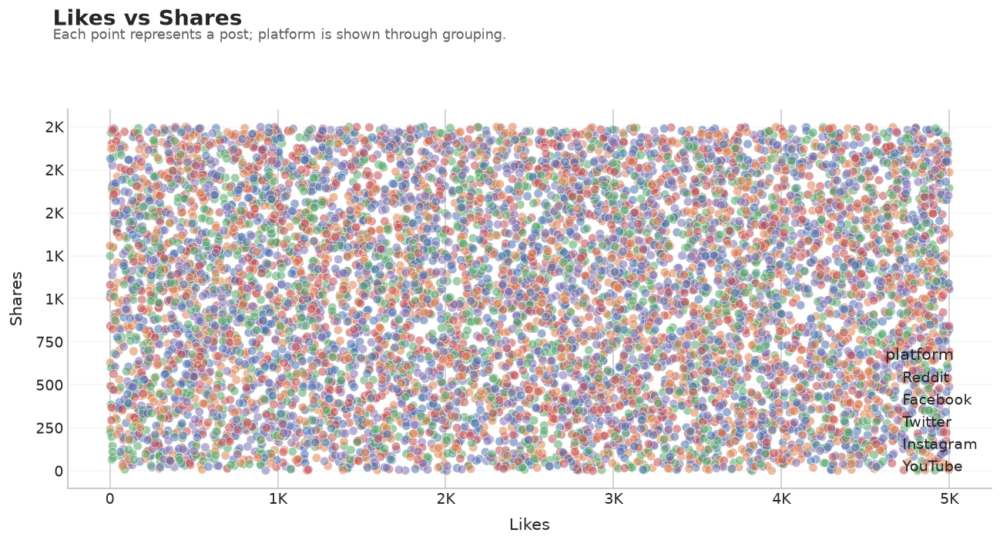

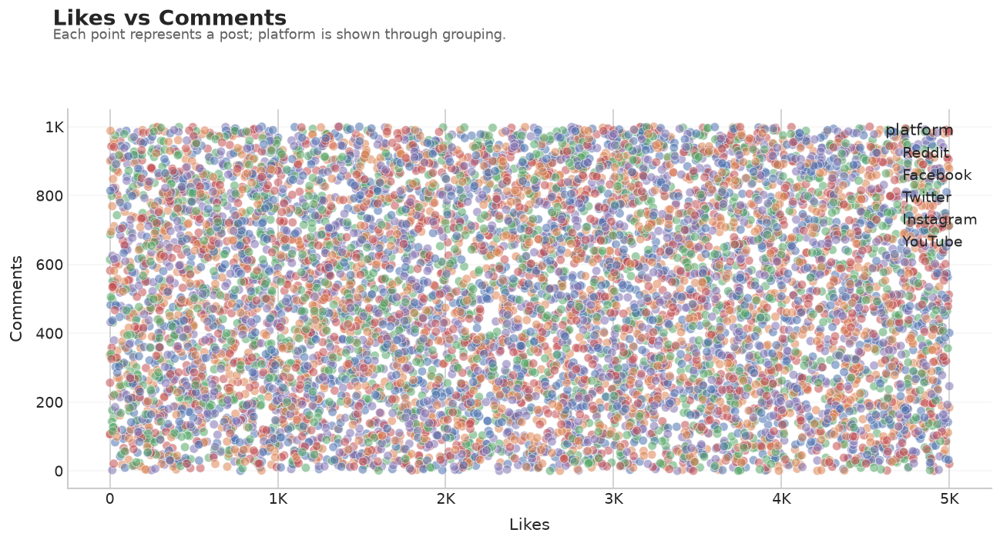

In [11]:
fig, ax = style_figure(
    'Likes vs Shares',
    'Each point represents a post; platform is shown through grouping.',
    figsize=(11, 6)
)

sns.scatterplot(
    data=df_posts,
    x='likes',
    y='shares',
    hue='platform',
    alpha=0.55,
    s=48,
    ax=ax
)

ax.set_xlabel('Likes')
ax.set_ylabel('Shares')
ax.xaxis.set_major_formatter(FuncFormatter(format_compact))
ax.yaxis.set_major_formatter(FuncFormatter(format_compact))
finish_ax(ax)
plt.tight_layout(rect=[0, 0, 1, 0.90])
plt.show()

fig, ax = style_figure(
    'Likes vs Comments',
    'Each point represents a post; platform is shown through grouping.',
    figsize=(11, 6)
)

sns.scatterplot(
    data=df_posts,
    x='likes',
    y='comments',
    hue='platform',
    alpha=0.55,
    s=48,
    ax=ax
)

ax.set_xlabel('Likes')
ax.set_ylabel('Comments')
ax.xaxis.set_major_formatter(FuncFormatter(format_compact))
ax.yaxis.set_major_formatter(FuncFormatter(format_compact))
finish_ax(ax)
plt.tight_layout(rect=[0, 0, 1, 0.90])
plt.show()

## 10. Engagement Correlation

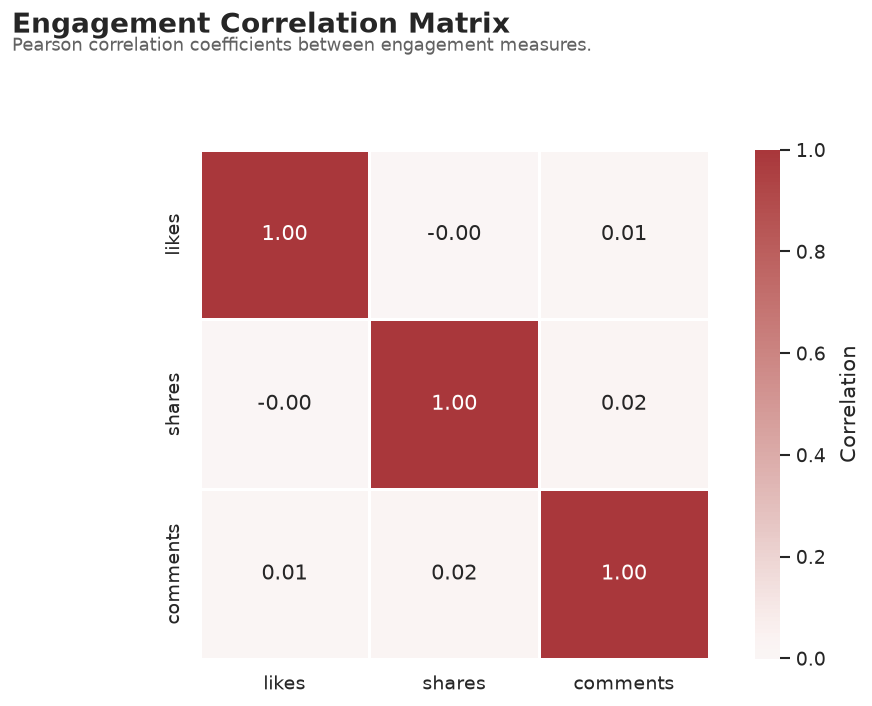

In [12]:
engagement_corr = df_posts[['likes', 'shares', 'comments']].corr()

fig, ax = style_figure(
    'Engagement Correlation Matrix',
    'Pearson correlation coefficients between engagement measures.',
    figsize=(8, 6)
)

sns.heatmap(
    engagement_corr,
    annot=True,
    fmt='.2f',
    cmap='vlag',
    center=0,
    square=True,
    linewidths=0.8,
    cbar_kws={'label': 'Correlation'},
    ax=ax
)

ax.set_xlabel('')
ax.set_ylabel('')
plt.tight_layout(rect=[0, 0, 1, 0.90])
plt.show()

## 11. User-Level Analysis

In [13]:
user_post_data = df_posts.merge(
    df_users,
    on='user_id',
    how='left',
    validate='many_to_one'
)

user_summary = (
    user_post_data.groupby('user_id')
    .agg(
        post_count=('post_id', 'count'),
        follower_count=('follower_count', 'first'),
        total_likes=('likes', 'sum'),
        avg_likes=('likes', 'mean'),
        total_shares=('shares', 'sum'),
        total_comments=('comments', 'sum')
    )
    .sort_values('post_count', ascending=False)
)

display(user_summary.head(10))

,post_count,follower_count,total_likes,avg_likes,total_shares,total_comments
user_id,,,,,,
user_zqv2vrf5,22,13531,48142.0,2533.789474,23066,12016
user_nfo3ih5u,19,40429,41718.0,2454.000000,22580,7231
user_n0ok02rt,18,2531,27883.0,1991.642857,14996,10030
user_q3vs0uj7,18,32714,31081.0,2220.071429,18703,8654
user_8wk0j5ae,18,36943,35683.0,2230.187500,15760,8180
user_0irp4abu,17,44206,43532.0,3109.428571,13248,10187
user_i1e1kek5,16,46765,38706.0,2580.400000,15581,8113
user_uerv85na,16,1824,38094.0,2930.307692,19471,7188
user_xetn4exw,16,14902,36172.0,2411.466667,14682,8823


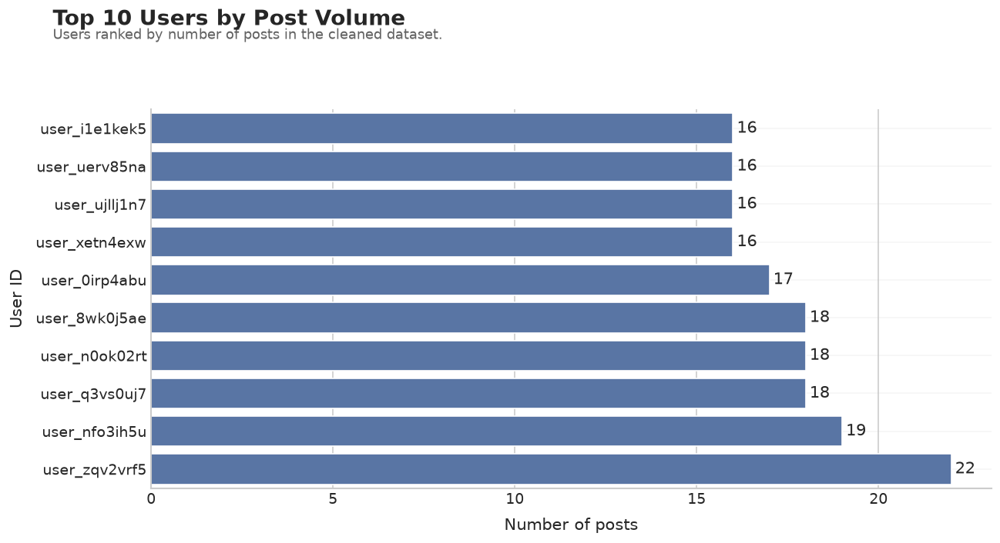

In [14]:
top_active_users = user_summary.head(10).sort_values('post_count')

fig, ax = style_figure(
    'Top 10 Users by Post Volume',
    'Users ranked by number of posts in the cleaned dataset.',
    figsize=(11, 6)
)

sns.barplot(
    data=top_active_users.reset_index(),
    x='post_count',
    y='user_id',
    ax=ax
)

ax.set_xlabel('Number of posts')
ax.set_ylabel('User ID')

for container in ax.containers:
    ax.bar_label(container, fmt='%.0f', padding=3)

finish_ax(ax)
plt.tight_layout(rect=[0, 0, 1, 0.90])
plt.show()

## 12. Follower Count vs Likes

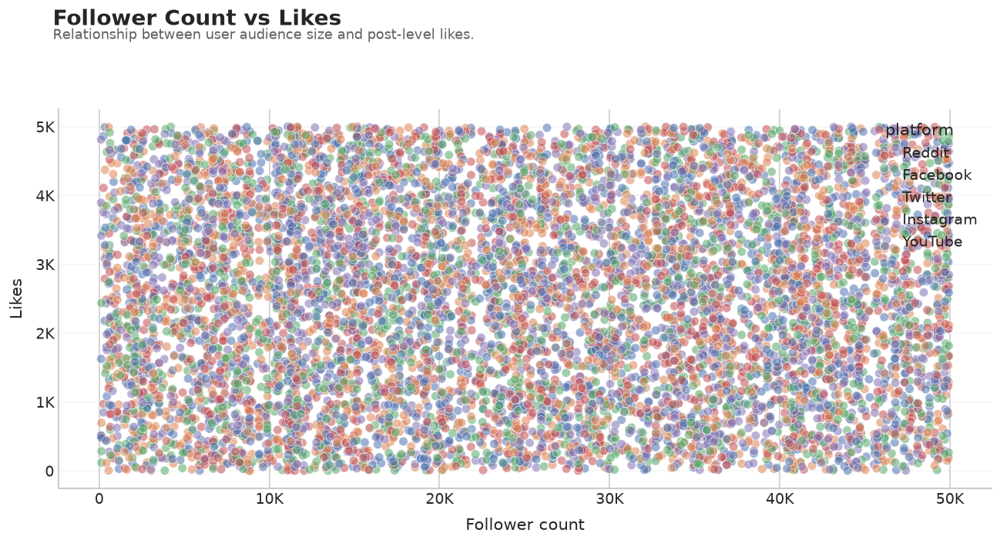

In [15]:
fig, ax = style_figure(
    'Follower Count vs Likes',
    'Relationship between user audience size and post-level likes.',
    figsize=(11, 6)
)

sns.scatterplot(
    data=user_post_data,
    x='follower_count',
    y='likes',
    hue='platform',
    alpha=0.55,
    s=48,
    ax=ax
)

ax.set_xlabel('Follower count')
ax.set_ylabel('Likes')
ax.xaxis.set_major_formatter(FuncFormatter(format_compact))
ax.yaxis.set_major_formatter(FuncFormatter(format_compact))
finish_ax(ax)
plt.tight_layout(rect=[0, 0, 1, 0.90])
plt.show()

## 13. Language and Location

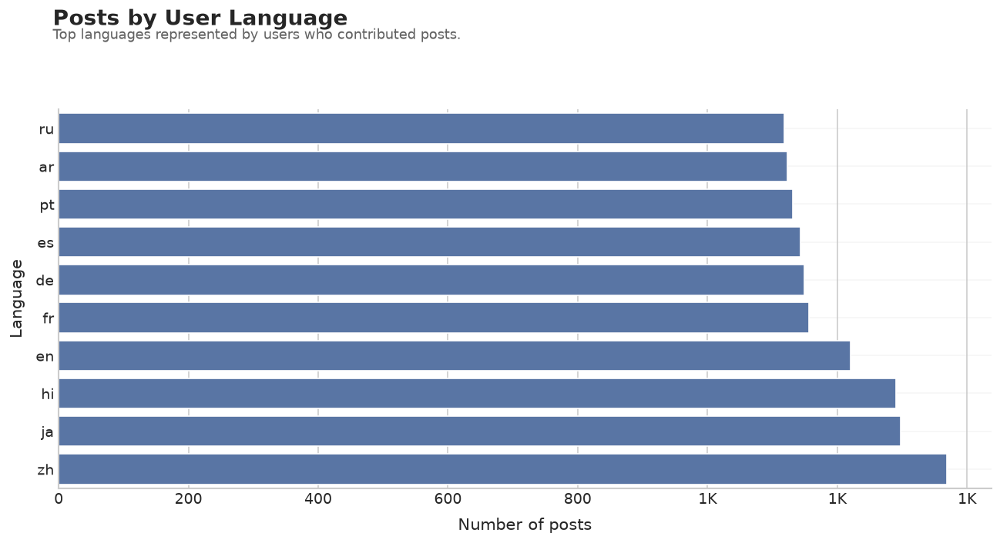

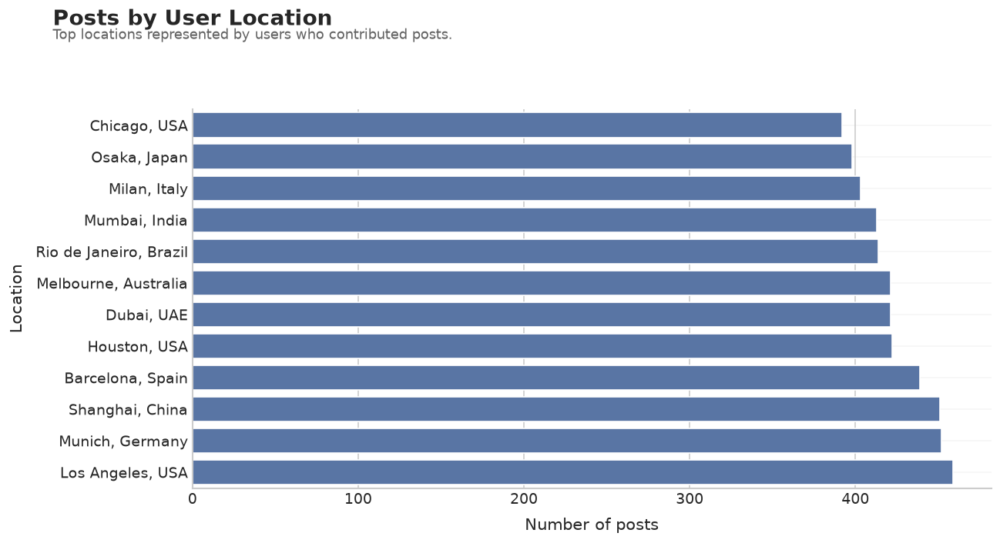

In [16]:
language_posts = user_post_data['language'].value_counts(dropna=False).head(12).sort_values()

fig, ax = style_figure(
    'Posts by User Language',
    'Top languages represented by users who contributed posts.',
    figsize=(11, 6)
)

sns.barplot(
    x=language_posts.values,
    y=language_posts.index,
    ax=ax
)

ax.set_xlabel('Number of posts')
ax.set_ylabel('Language')
ax.xaxis.set_major_formatter(FuncFormatter(format_compact))
finish_ax(ax)
plt.tight_layout(rect=[0, 0, 1, 0.90])
plt.show()

location_posts = user_post_data['location'].value_counts(dropna=False).head(12).sort_values()

fig, ax = style_figure(
    'Posts by User Location',
    'Top locations represented by users who contributed posts.',
    figsize=(11, 6)
)

sns.barplot(
    x=location_posts.values,
    y=location_posts.index,
    ax=ax
)

ax.set_xlabel('Number of posts')
ax.set_ylabel('Location')
ax.xaxis.set_major_formatter(FuncFormatter(format_compact))
finish_ax(ax)
plt.tight_layout(rect=[0, 0, 1, 0.90])
plt.show()

## 14. Text Characteristics

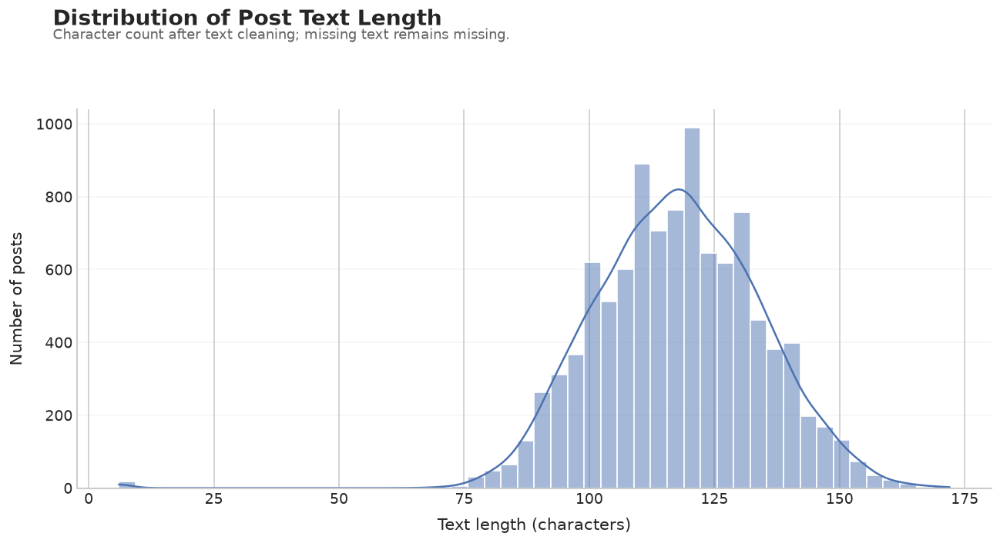

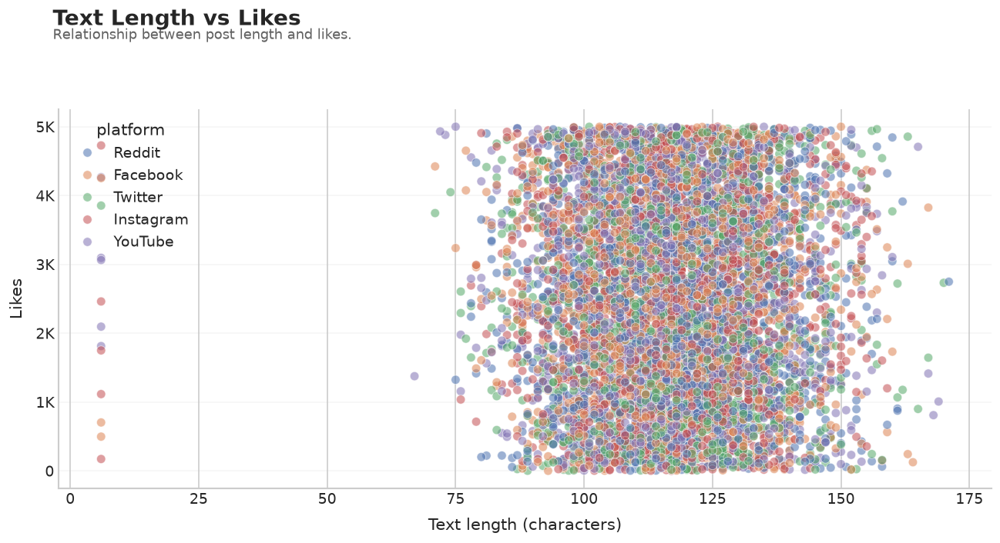

In [17]:
df_posts['text_length'] = df_posts['text_content'].str.len()

fig, ax = style_figure(
    'Distribution of Post Text Length',
    'Character count after text cleaning; missing text remains missing.',
    figsize=(11, 6)
)

sns.histplot(
    data=df_posts,
    x='text_length',
    bins=50,
    kde=True,
    ax=ax
)

ax.set_xlabel('Text length (characters)')
ax.set_ylabel('Number of posts')
ax.xaxis.set_major_formatter(FuncFormatter(format_compact))
finish_ax(ax)
plt.tight_layout(rect=[0, 0, 1, 0.90])
plt.show()

fig, ax = style_figure(
    'Text Length vs Likes',
    'Relationship between post length and likes.',
    figsize=(11, 6)
)

sns.scatterplot(
    data=df_posts,
    x='text_length',
    y='likes',
    hue='platform',
    alpha=0.55,
    s=48,
    ax=ax
)

ax.set_xlabel('Text length (characters)')
ax.set_ylabel('Likes')
ax.yaxis.set_major_formatter(FuncFormatter(format_compact))
finish_ax(ax)
plt.tight_layout(rect=[0, 0, 1, 0.90])
plt.show()

## 15. Overall Correlation

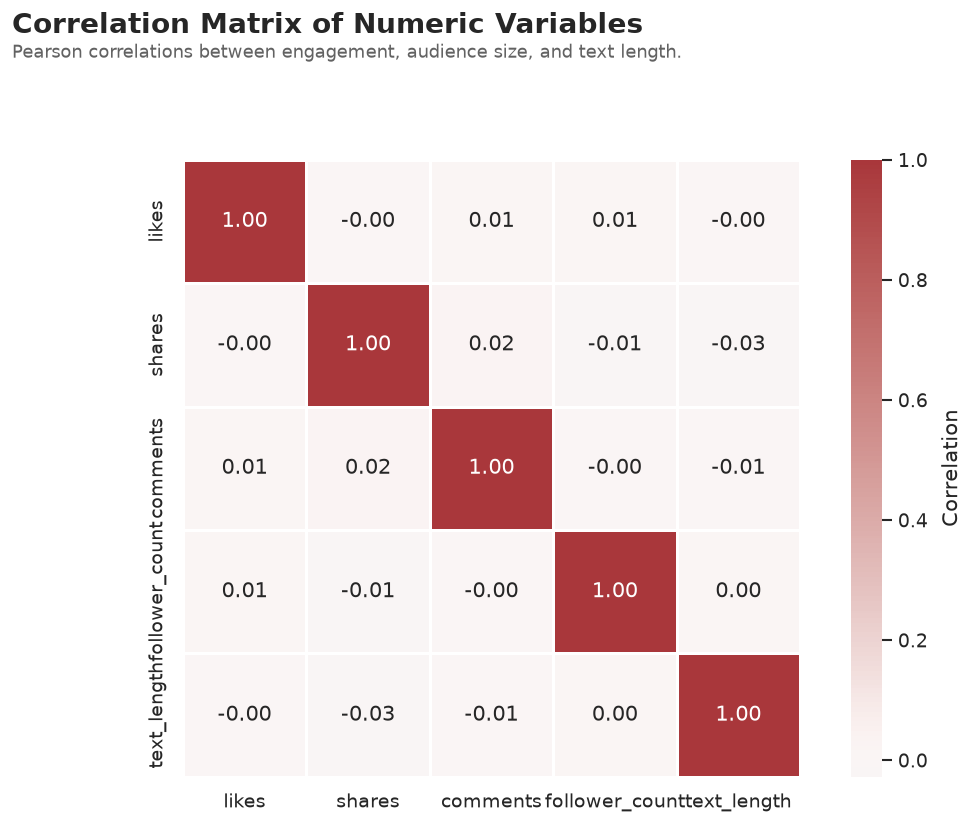

In [18]:
numeric_columns = [
    'likes',
    'shares',
    'comments',
    'follower_count',
    'text_length'
]

overall_corr = user_post_data[numeric_columns].corr()

fig, ax = style_figure(
    'Correlation Matrix of Numeric Variables',
    'Pearson correlations between engagement, audience size, and text length.',
    figsize=(9, 7)
)

sns.heatmap(
    overall_corr,
    annot=True,
    fmt='.2f',
    cmap='vlag',
    center=0,
    square=True,
    linewidths=0.8,
    cbar_kws={'label': 'Correlation'},
    ax=ax
)

ax.set_xlabel('')
ax.set_ylabel('')
plt.tight_layout(rect=[0, 0, 1, 0.90])
plt.show()

## 16. High-Engagement Posts

In [19]:
df_posts['total_engagement'] = (
    df_posts['likes'].fillna(0)
    + df_posts['shares'].fillna(0)
    + df_posts['comments'].fillna(0)
)

top_engagement_posts = (
    df_posts[
        [
            'post_id', 'user_id', 'platform', 'date',
            'likes', 'shares', 'comments', 'total_engagement'
        ]
    ]
    .sort_values('total_engagement', ascending=False)
    .head(10)
)

display(top_engagement_posts)

,post_id,user_id,platform,date,likes,shares,comments,total_engagement
11875,ycjj5zzt7mvx,user_d9971ba6,Instagram,2025-02-19,4983.0,1919,991,7893.0
3645,wo7py9aljg3t,user_o8le7hqf,Reddit,2025-04-28,4864.0,1981,948,7793.0
10317,gmoeib832zbs,user_pe5yckyb,Facebook,2025-01-24,4902.0,1880,982,7764.0
3327,5kvuyvf38nqx,user_z0feut2e,YouTube,2024-06-09,4923.0,1971,861,7755.0
8696,pvfl3d8hj7jd,user_csluibwk,Instagram,2024-05-15,4989.0,1840,909,7738.0
8399,tdgjjylpua20,user_8nvzxsuj,NaN,2024-06-02,4979.0,1932,812,7723.0
5141,tne7s3o4l4wd,user_lr3fagdl,Instagram,2024-10-30,4931.0,1903,878,7712.0
6632,a1kiwl618kzy,user_aaiari8o,Facebook,2025-04-09,4811.0,1952,920,7683.0
8740,fp89q1ickn9w,user_h4lueh1i,Twitter,2025-03-15,4740.0,1933,955,7628.0
6540,5n161ir5hhhr,user_u98jwp3f,YouTube,2025-01-26,4751.0,1981,878,7610.0


# PDF Report Generation

The following section automatically computes the observations from the dataset and creates a PDF containing the analytical narrative and the main EDA figures.

No findings are hard-coded. The report text is generated from the calculated results.

In [20]:
# Prepare report statistics
total_posts = len(df_posts)
total_users = len(df_users)
unique_post_users = df_posts['user_id'].nunique()

date_min = pd.to_datetime(df_posts['date'], errors='coerce').min()
date_max = pd.to_datetime(df_posts['date'], errors='coerce').max()

platform_counts_full = df_posts['platform'].fillna('Missing').value_counts()
top_platform = platform_counts_full.index[0]
top_platform_count = int(platform_counts_full.iloc[0])

engagement_stats = df_posts[['likes', 'shares', 'comments']].describe()

top_day = weekday_counts.idxmax()
top_day_count = int(weekday_counts.max())

known_hours = hour_counts.dropna()
top_hour = int(known_hours.idxmax()) if len(known_hours) else None
top_hour_count = int(known_hours.max()) if len(known_hours) else None

corr_ls = df_posts[['likes', 'shares']].corr().iloc[0, 1]
corr_lc = df_posts[['likes', 'comments']].corr().iloc[0, 1]

followers_likes_corr = user_post_data[['follower_count', 'likes']].corr().iloc[0, 1]
text_likes_corr = df_posts[['text_length', 'likes']].corr().iloc[0, 1]

top_user_id = user_summary.index[0]
top_user_posts = int(user_summary.iloc[0]['post_count'])

missing_summary = post_missing[post_missing > 0].sort_values(ascending=False)

print('Report statistics calculated successfully.')

Report statistics calculated successfully.


In [21]:
def correlation_description(value):
    if pd.isna(value):
        return 'could not be calculated'
    strength = abs(value)
    if strength < 0.20:
        level = 'very weak'
    elif strength < 0.40:
        level = 'weak'
    elif strength < 0.60:
        level = 'moderate'
    elif strength < 0.80:
        level = 'strong'
    else:
        level = 'very strong'
    direction = 'positive' if value >= 0 else 'negative'
    return f'{level} {direction} correlation (r = {value:.2f})'


insights = [
    f'The cleaned posts dataset contains {total_posts:,} posts contributed by '
    f'{unique_post_users:,} unique users. The user dataset contains {total_users:,} user profiles.',

    f'Posts span from {date_min:%d %b %Y} to {date_max:%d %b %Y}. '
    f'{top_platform} has the highest post volume with {top_platform_count:,} posts.',

    f'{top_day} is the busiest day of the week with {top_day_count:,} posts. '
    + (
        f'The busiest known posting hour is {top_hour:02d}:00 with {top_hour_count:,} posts.'
        if top_hour is not None else
        'Posting-hour concentration could not be determined because no valid posting times were available.'
    ),

    f'Likes and shares show a {correlation_description(corr_ls)}, while likes and comments show a '
    f'{correlation_description(corr_lc)}.',

    f'Follower count and likes show a {correlation_description(followers_likes_corr)} relationship. '
    'This describes association in the dataset and should not be interpreted as causation.',

    f'Text length and likes show a {correlation_description(text_likes_corr)} relationship. '
    'Post length alone therefore should not be treated as a direct explanation of engagement.',

    f'The most active user is {top_user_id}, with {top_user_posts:,} posts in the cleaned dataset.',

    f'The highest-engagement posts were identified using total engagement, calculated as likes + shares + comments. '
    f'The leading post has {int(top_engagement_posts.iloc[0]["total_engagement"]):,} total recorded interactions.'
]

print('Generated findings:')
for i, insight in enumerate(insights, 1):
    print(f'{i}. {insight}')

Generated findings:
1. The cleaned posts dataset contains 12,000 posts contributed by 1,500 unique users. The user dataset contains 1,500 user profiles.
2. Posts span from 01 May 2024 to 30 Apr 2025. Facebook has the highest post volume with 2,074 posts.
3. Wednesday is the busiest day of the week with 1,771 posts. The busiest known posting hour is 23:00 with 388 posts.
4. Likes and shares show a very weak negative correlation (r = -0.00), while likes and comments show a very weak positive correlation (r = 0.01).
5. Follower count and likes show a very weak positive correlation (r = 0.01) relationship. This describes association in the dataset and should not be interpreted as causation.
6. Text length and likes show a very weak negative correlation (r = -0.00) relationship. Post length alone therefore should not be treated as a direct explanation of engagement.
7. The most active user is user_zqv2vrf5, with 22 posts in the cleaned dataset.
8. The highest-engagement posts were identifie

Prepared 20 report figures.


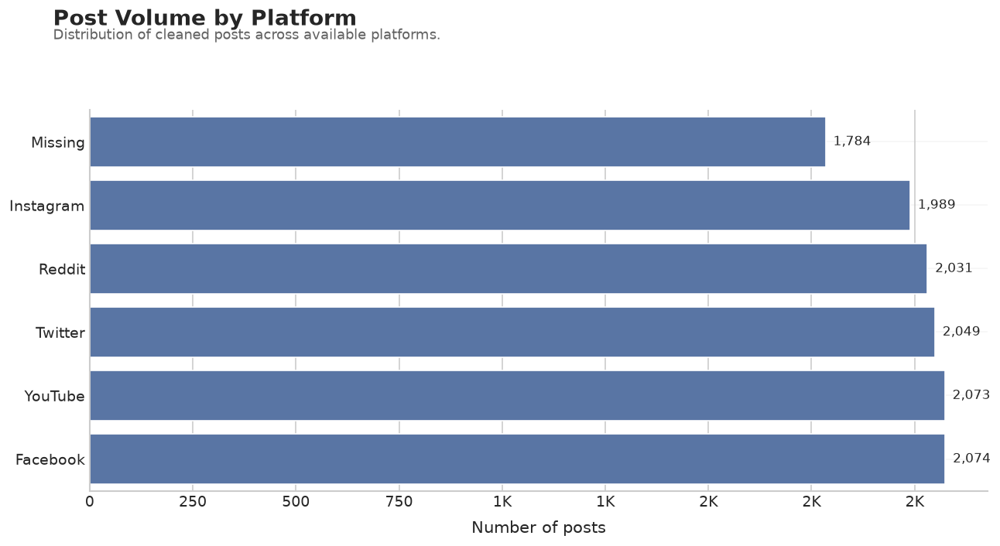

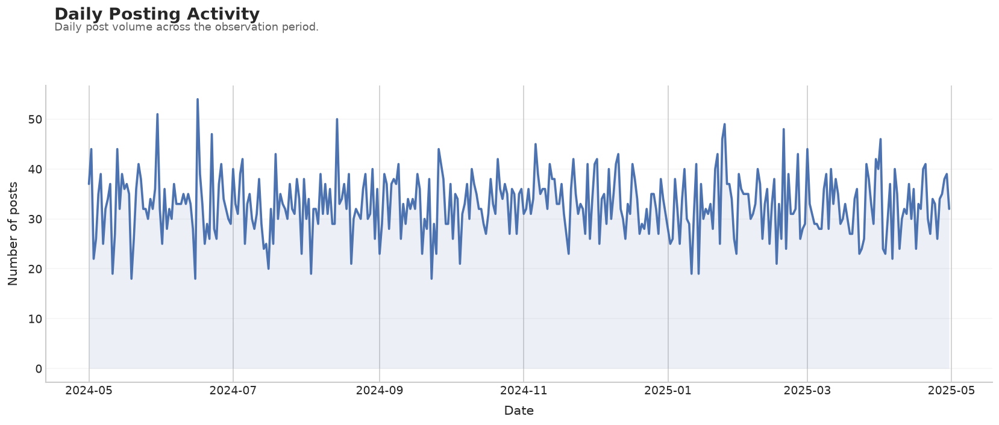

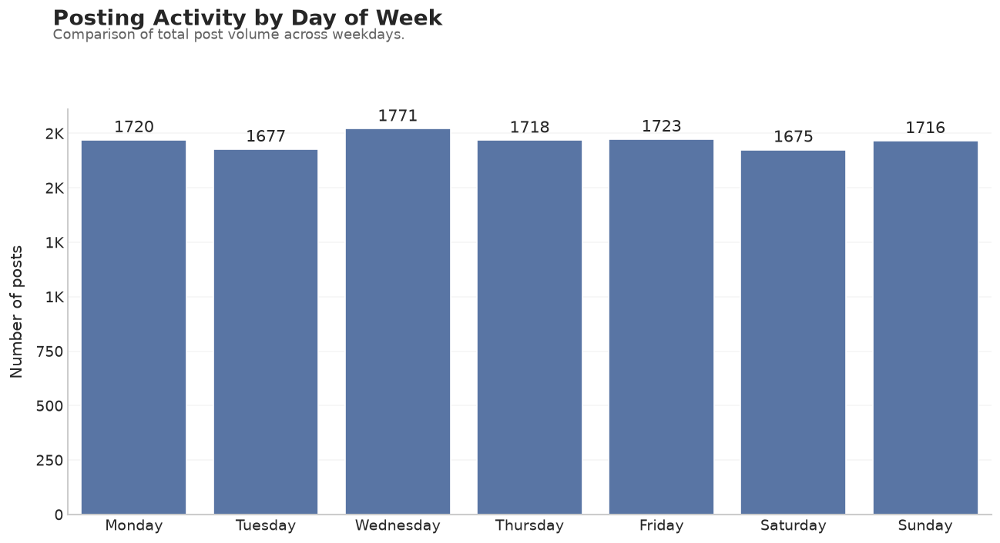

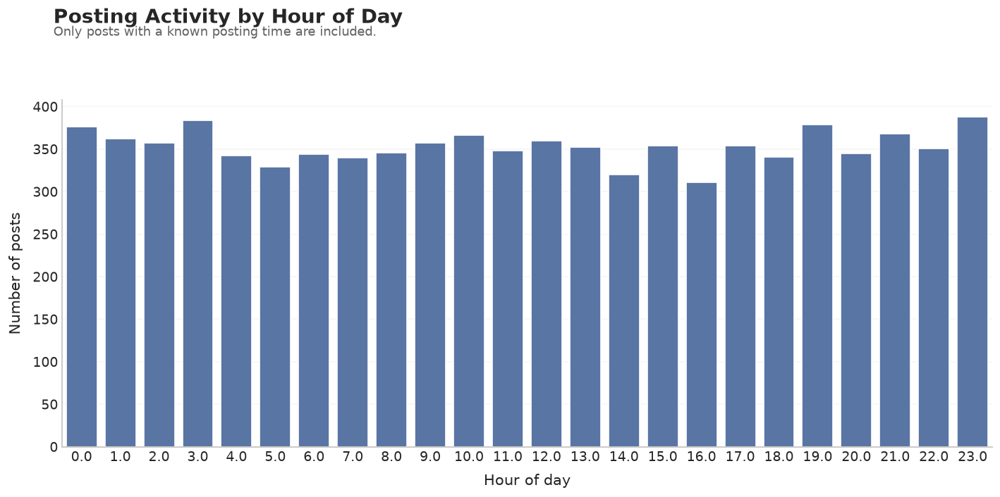

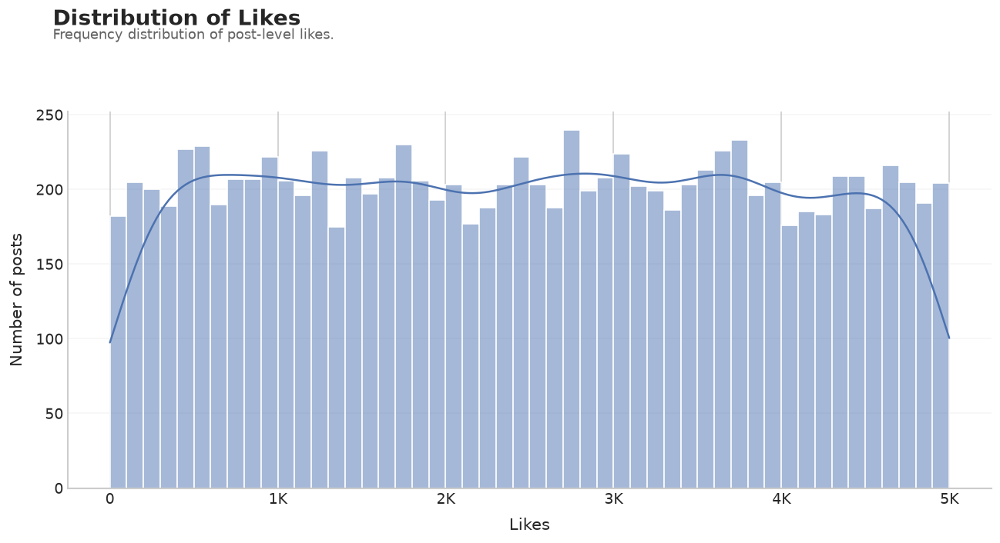

...

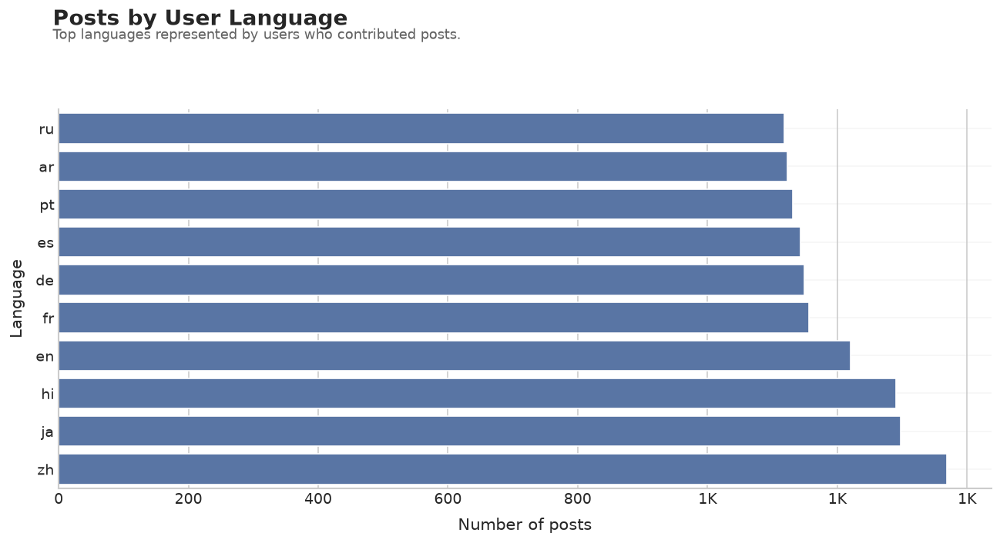

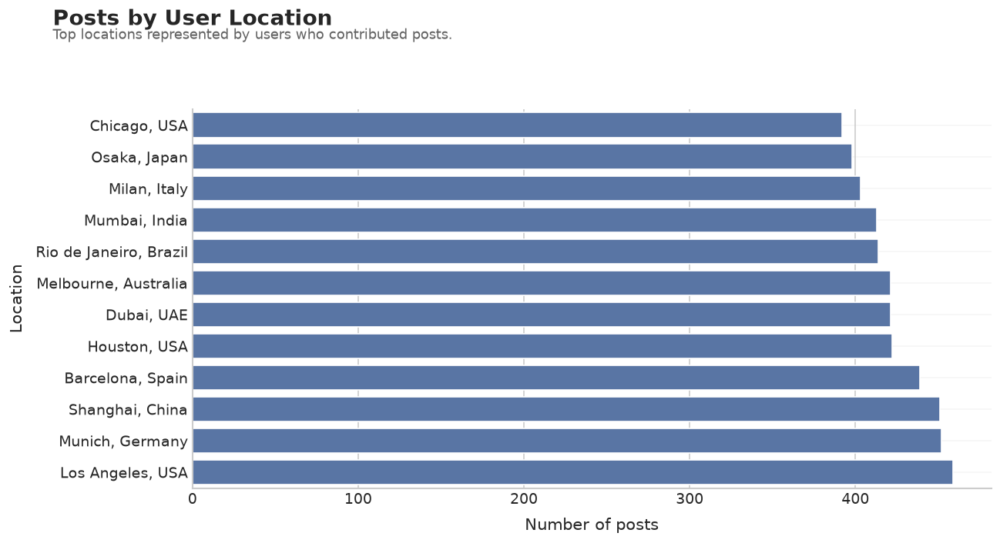

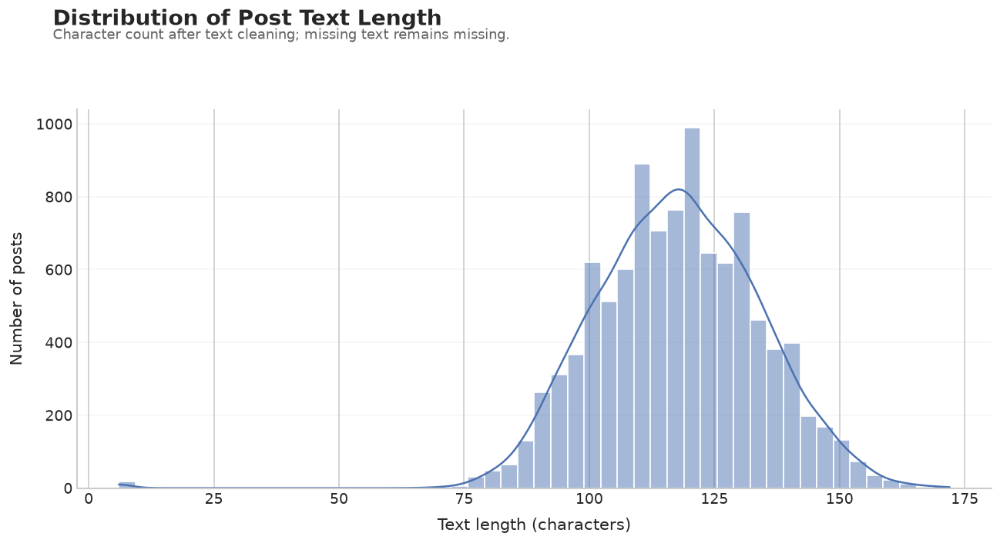

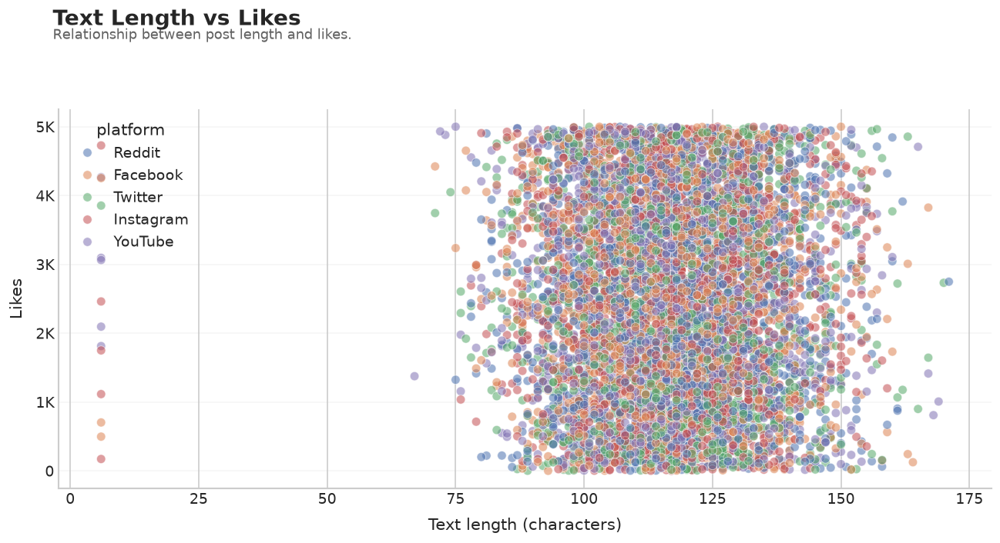

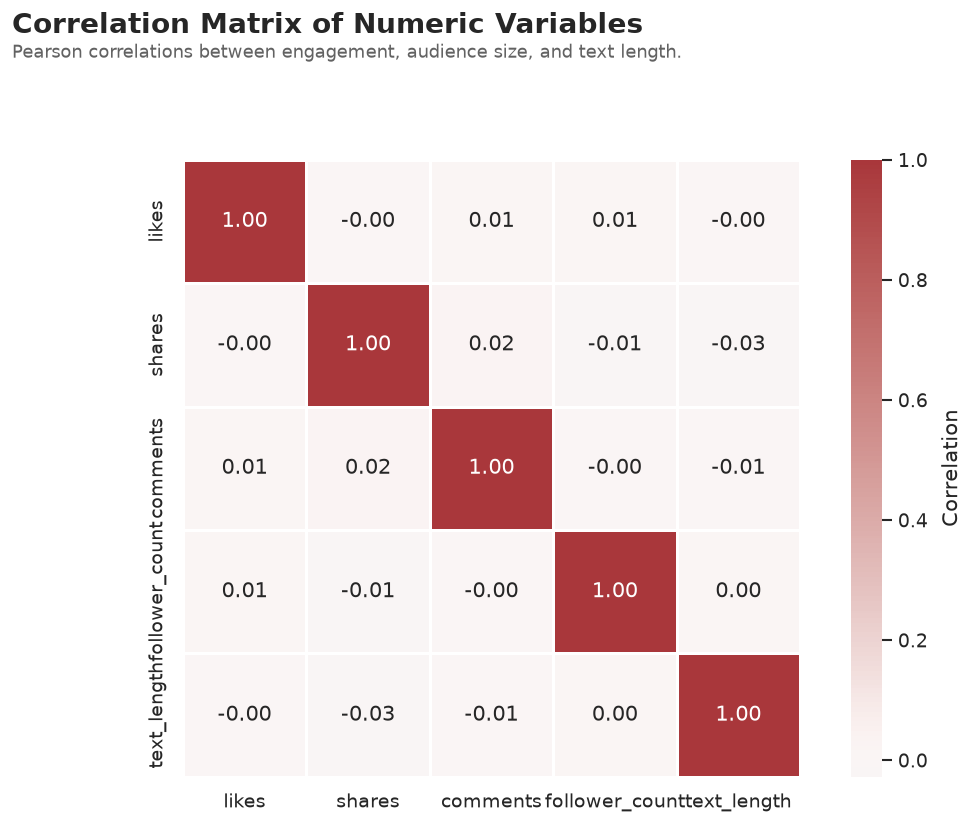

In [22]:
# Build report figures in a controlled order.
report_figures = []

def capture_current_figure():
    report_figures.append(plt.gcf())

# Platform
fig, ax = style_figure('Post Volume by Platform',
                       'Distribution of cleaned posts across available platforms.',
                       figsize=(11, 6))
sns.barplot(x=platform_counts.values, y=platform_counts.index, ax=ax)
ax.set_xlabel('Number of posts')
ax.set_ylabel('')
ax.xaxis.set_major_formatter(FuncFormatter(format_compact))
finish_ax(ax)
for i, value in enumerate(platform_counts.values):
    ax.text(value, i, f'  {value:,}', va='center', fontsize=10)
plt.tight_layout(rect=[0, 0, 1, 0.90])
capture_current_figure()

# Daily activity
fig, ax = style_figure('Daily Posting Activity',
                       'Daily post volume across the observation period.',
                       figsize=(14, 6))
sns.lineplot(data=daily_posts, x='date', y='post_count', ax=ax, linewidth=2.2)
ax.fill_between(daily_posts['date'], daily_posts['post_count'], alpha=0.10)
ax.set_xlabel('Date')
ax.set_ylabel('Number of posts')
ax.yaxis.set_major_formatter(FuncFormatter(format_compact))
finish_ax(ax)
plt.tight_layout(rect=[0, 0, 1, 0.90])
capture_current_figure()

# Weekday
fig, ax = style_figure('Posting Activity by Day of Week',
                       'Comparison of total post volume across weekdays.',
                       figsize=(11, 6))
sns.barplot(x=weekday_counts.index, y=weekday_counts.values, ax=ax)
ax.set_xlabel('')
ax.set_ylabel('Number of posts')
ax.yaxis.set_major_formatter(FuncFormatter(format_compact))
for container in ax.containers:
    ax.bar_label(container, fmt='%.0f', padding=3)
finish_ax(ax)
plt.tight_layout(rect=[0, 0, 1, 0.90])
capture_current_figure()

# Hour
fig, ax = style_figure('Posting Activity by Hour of Day',
                       'Only posts with a known posting time are included.',
                       figsize=(12, 6))
sns.barplot(x=hour_counts.index, y=hour_counts.values, ax=ax)
ax.set_xlabel('Hour of day')
ax.set_ylabel('Number of posts')
ax.set_xticks(range(24))
ax.yaxis.set_major_formatter(FuncFormatter(format_compact))
finish_ax(ax)
plt.tight_layout(rect=[0, 0, 1, 0.90])
capture_current_figure()

# Engagement distributions
for column in ['likes', 'shares', 'comments']:
    fig, ax = style_figure(f'Distribution of {column.title()}',
                           f'Frequency distribution of post-level {column}.',
                           figsize=(11, 6))
    sns.histplot(data=df_posts, x=column, bins=50, kde=True, ax=ax)
    ax.set_xlabel(column.title())
    ax.set_ylabel('Number of posts')
    ax.xaxis.set_major_formatter(FuncFormatter(format_compact))
    finish_ax(ax)
    plt.tight_layout(rect=[0, 0, 1, 0.90])
    capture_current_figure()

# Engagement boxplots
for column in ['likes', 'shares', 'comments']:
    fig, ax = style_figure(f'{column.title()} by Platform',
                           'Box plots show the central tendency, spread, and extreme observations.',
                           figsize=(11, 6))
    sns.boxplot(data=df_posts, x='platform', y=column, ax=ax, showfliers=False)
    ax.set_xlabel('')
    ax.set_ylabel(column.title())
    ax.yaxis.set_major_formatter(FuncFormatter(format_compact))
    finish_ax(ax)
    plt.tight_layout(rect=[0, 0, 1, 0.90])
    capture_current_figure()

# Likes vs shares
fig, ax = style_figure('Likes vs Shares',
                       'Each point represents a post; platform is shown through grouping.',
                       figsize=(11, 6))
sns.scatterplot(data=df_posts, x='likes', y='shares', hue='platform',
                alpha=0.55, s=48, ax=ax)
ax.set_xlabel('Likes')
ax.set_ylabel('Shares')
ax.xaxis.set_major_formatter(FuncFormatter(format_compact))
ax.yaxis.set_major_formatter(FuncFormatter(format_compact))
finish_ax(ax)
plt.tight_layout(rect=[0, 0, 1, 0.90])
capture_current_figure()

# Likes vs comments
fig, ax = style_figure('Likes vs Comments',
                       'Each point represents a post; platform is shown through grouping.',
                       figsize=(11, 6))
sns.scatterplot(data=df_posts, x='likes', y='comments', hue='platform',
                alpha=0.55, s=48, ax=ax)
ax.set_xlabel('Likes')
ax.set_ylabel('Comments')
ax.xaxis.set_major_formatter(FuncFormatter(format_compact))
ax.yaxis.set_major_formatter(FuncFormatter(format_compact))
finish_ax(ax)
plt.tight_layout(rect=[0, 0, 1, 0.90])
capture_current_figure()

# Correlation
fig, ax = style_figure('Engagement Correlation Matrix',
                       'Pearson correlation coefficients between engagement measures.',
                       figsize=(8, 6))
sns.heatmap(engagement_corr, annot=True, fmt='.2f', cmap='vlag',
            center=0, square=True, linewidths=0.8,
            cbar_kws={'label': 'Correlation'}, ax=ax)
ax.set_xlabel('')
ax.set_ylabel('')
plt.tight_layout(rect=[0, 0, 1, 0.90])
capture_current_figure()

# Top users
fig, ax = style_figure('Top 10 Users by Post Volume',
                       'Users ranked by number of posts in the cleaned dataset.',
                       figsize=(11, 6))
sns.barplot(data=top_active_users.reset_index(), x='post_count', y='user_id', ax=ax)
ax.set_xlabel('Number of posts')
ax.set_ylabel('User ID')
for container in ax.containers:
    ax.bar_label(container, fmt='%.0f', padding=3)
finish_ax(ax)
plt.tight_layout(rect=[0, 0, 1, 0.90])
capture_current_figure()

# Followers vs likes
fig, ax = style_figure('Follower Count vs Likes',
                       'Relationship between user audience size and post-level likes.',
                       figsize=(11, 6))
sns.scatterplot(data=user_post_data, x='follower_count', y='likes',
                hue='platform', alpha=0.55, s=48, ax=ax)
ax.set_xlabel('Follower count')
ax.set_ylabel('Likes')
ax.xaxis.set_major_formatter(FuncFormatter(format_compact))
ax.yaxis.set_major_formatter(FuncFormatter(format_compact))
finish_ax(ax)
plt.tight_layout(rect=[0, 0, 1, 0.90])
capture_current_figure()

# Language
fig, ax = style_figure('Posts by User Language',
                       'Top languages represented by users who contributed posts.',
                       figsize=(11, 6))
sns.barplot(x=language_posts.values, y=language_posts.index, ax=ax)
ax.set_xlabel('Number of posts')
ax.set_ylabel('Language')
ax.xaxis.set_major_formatter(FuncFormatter(format_compact))
finish_ax(ax)
plt.tight_layout(rect=[0, 0, 1, 0.90])
capture_current_figure()

# Location
fig, ax = style_figure('Posts by User Location',
                       'Top locations represented by users who contributed posts.',
                       figsize=(11, 6))
sns.barplot(x=location_posts.values, y=location_posts.index, ax=ax)
ax.set_xlabel('Number of posts')
ax.set_ylabel('Location')
ax.xaxis.set_major_formatter(FuncFormatter(format_compact))
finish_ax(ax)
plt.tight_layout(rect=[0, 0, 1, 0.90])
capture_current_figure()

# Text length
fig, ax = style_figure('Distribution of Post Text Length',
                       'Character count after text cleaning; missing text remains missing.',
                       figsize=(11, 6))
sns.histplot(data=df_posts, x='text_length', bins=50, kde=True, ax=ax)
ax.set_xlabel('Text length (characters)')
ax.set_ylabel('Number of posts')
ax.xaxis.set_major_formatter(FuncFormatter(format_compact))
finish_ax(ax)
plt.tight_layout(rect=[0, 0, 1, 0.90])
capture_current_figure()

# Text vs likes
fig, ax = style_figure('Text Length vs Likes',
                       'Relationship between post length and likes.',
                       figsize=(11, 6))
sns.scatterplot(data=df_posts, x='text_length', y='likes',
                hue='platform', alpha=0.55, s=48, ax=ax)
ax.set_xlabel('Text length (characters)')
ax.set_ylabel('Likes')
ax.yaxis.set_major_formatter(FuncFormatter(format_compact))
finish_ax(ax)
plt.tight_layout(rect=[0, 0, 1, 0.90])
capture_current_figure()

# Overall correlation
fig, ax = style_figure('Correlation Matrix of Numeric Variables',
                       'Pearson correlations between engagement, audience size, and text length.',
                       figsize=(9, 7))
sns.heatmap(overall_corr, annot=True, fmt='.2f', cmap='vlag',
            center=0, square=True, linewidths=0.8,
            cbar_kws={'label': 'Correlation'}, ax=ax)
ax.set_xlabel('')
ax.set_ylabel('')
plt.tight_layout(rect=[0, 0, 1, 0.90])
capture_current_figure()

print(f'Prepared {len(report_figures)} report figures.')

In [23]:
# Generate the final PDF report.
REPORT_FILE = 'Social_Engine_EDA_Report.pdf'

def add_text_page(pdf, title, paragraphs=None, bullets=None, footer=None):
    fig = plt.figure(figsize=(8.27, 11.69))
    fig.patch.set_facecolor('white')
    fig.text(0.08, 0.93, title, fontsize=22, fontweight='bold', va='top')

    y = 0.875

    if paragraphs:
        for paragraph in paragraphs:
            lines = wrap(str(paragraph), width=88)
            fig.text(
                0.08, y,
                '\n'.join(lines),
                fontsize=11,
                va='top',
                linespacing=1.5
            )
            y -= 0.045 * (len(lines) + 1)

    if bullets:
        for bullet in bullets:
            lines = wrap(str(bullet), width=82)
            text = '• ' + '\n  '.join(lines)
            fig.text(
                0.09, y,
                text,
                fontsize=11,
                va='top',
                linespacing=1.45
            )
            y -= 0.045 * (len(lines) + 1)

    if footer:
        fig.text(0.08, 0.045, footer, fontsize=8.5, alpha=0.55)

    pdf.savefig(fig, bbox_inches='tight')
    plt.close(fig)


with PdfPages(REPORT_FILE) as pdf:
    # Cover
    add_text_page(
        pdf,
        'Social Engine — Exploratory Data Analysis',
        paragraphs=[
            'EDA Report',
            f'Dataset period: {date_min:%d %b %Y} to {date_max:%d %b %Y}',
            f'Posts analysed: {total_posts:,}',
            f'Users analysed: {total_users:,}',
            '',
            'Purpose: identify patterns, relationships, distributions, and notable observations in the cleaned social-media dataset.'
        ],
        footer='Generated directly from the EDA notebook.'
    )

    # Executive summary
    add_text_page(
        pdf,
        'Executive Summary',
        paragraphs=[
            'The analysis examines posting activity, platform distribution, engagement behaviour, user characteristics, geographic and language representation, and text characteristics.',
            'The findings below are generated from the calculated dataset statistics and are intended to guide interpretation of the visual analysis.'
        ],
        bullets=insights,
        footer='Interpretation is limited to relationships observed in the supplied dataset.'
    )

    # Data quality context
    add_text_page(
        pdf,
        'Data Context',
        paragraphs=[
            'The EDA uses the cleaned posts and user datasets. The time field is intentionally excluded from the general missing-value summary because records originating from date-only timestamps have unknown posting times rather than recoverable missing times.',
            'Missing values in other analytical fields are retained rather than fabricated. Visualizations use the available observations appropriate to each analysis.'
        ],
        bullets=[
            f'Posts: {total_posts:,}',
            f'Users: {total_users:,}',
            f'Unique users represented in posts: {unique_post_users:,}',
            f'Date range: {date_min:%Y-%m-%d} to {date_max:%Y-%m-%d}',
            f'Top platform by post volume: {top_platform} ({top_platform_count:,} posts)'
        ],
        footer='Data-quality decisions follow the cleaning workflow.'
    )

    # Figures
    for fig in report_figures:
        pdf.savefig(fig, bbox_inches='tight')

    # Key tables
    add_text_page(
        pdf,
        'Key Numerical Results',
        paragraphs=[
            'The following statistics provide compact reference values for the principal numerical variables.'
        ],
        bullets=[
            f"Median likes: {engagement_stats.loc['50%', 'likes']:,.0f}",
            f"Median shares: {engagement_stats.loc['50%', 'shares']:,.0f}",
            f"Median comments: {engagement_stats.loc['50%', 'comments']:,.0f}",
            f"Mean likes: {engagement_stats.loc['mean', 'likes']:,.2f}",
            f"Mean shares: {engagement_stats.loc['mean', 'shares']:,.2f}",
            f"Mean comments: {engagement_stats.loc['mean', 'comments']:,.2f}",
            f"Likes–shares correlation: {corr_ls:.2f}",
            f"Likes–comments correlation: {corr_lc:.2f}",
            f"Follower count–likes correlation: {followers_likes_corr:.2f}",
            f"Text length–likes correlation: {text_likes_corr:.2f}"
        ],
        footer='Correlation values describe linear association, not causation.'
    )

    add_text_page(
        pdf,
        'Conclusion',
        paragraphs=[
            'The EDA establishes the major structural and behavioural patterns in the cleaned social-media dataset.',
            'The strongest findings should be interpreted alongside the distributions, platform comparisons, temporal patterns, and correlation matrices rather than from individual observations alone.',
            'The generated visualizations and numerical results provide the evidence base for the final challenge submission report.'
        ],
        footer='End of report.'
    )

print(f'PDF report created: {Path(REPORT_FILE).resolve()}')

PDF report created: /home/kash/social_engine_slayers/Social_Engine_EDA_Report.pdf


## Output

Running the notebook produces:

- `Social_Engine_EDA_Report.pdf` — formatted EDA report
- all EDA visualizations directly in the notebook

The PDF is regenerated whenever the notebook is executed, so its findings remain tied to the current cleaned dataset.